# Цель:
     Сформировать комереческое предложение на осоновании данных о белом винне

# Задачи:
    1.Подготовка датафрейма
    2.Выбор наилучщей модели обучения 
    3.Реализация класса для предсокозания качества вина 
    


<b>Импорт необходимых бибилиотек</b>

In [10]:
import numpy as np 
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LinearRegression
from sklearn.naive_bayes import GaussianNB
import sklearn.metrics as metrics
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score, train_test_split
import plotly.offline as offline
import plotly.graph_objs as graph
import seaborn as sea
pd.options.mode.chained_assignment = None
offline.init_notebook_mode()

<h3><b>Загрузка датафрейма</b></h3>

In [11]:
winne = pd.read_csv('winequality-white.csv', sep=';')
winne.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


<h3><b>Создание объектов методов обучения</b></h3>

In [12]:
forest = RandomForestClassifier(random_state=30, n_jobs=-1, n_estimators=200)
svc = SVC(kernel="sigmoid")
knn = KNeighborsClassifier(n_neighbors=3, n_jobs=-1)
std = StandardScaler()
gaus = GaussianNB()

<h3><b>Удаление выбрасов данных занчение котрых в 2 раза больше среднего</b></h3>


In [13]:
for i in winne.columns.values:
    winne = winne.drop(index=winne[winne[i].values / winne[i].mean() > 2].index.values)

In [14]:
winne

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
5,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


In [15]:
name = [i for i in winne.quality.value_counts().index.values] 
values = [winne.quality.value_counts()[i] for i in winne.quality.value_counts().index.values]
gist = [graph.Bar(x=name, y=values)]
graph.Figure(data=gist).update_layout(title = 'количесвто наблюдений в каждом классе качества')

<b><h3>график распределения наблюдаемых признаков </b></h3>

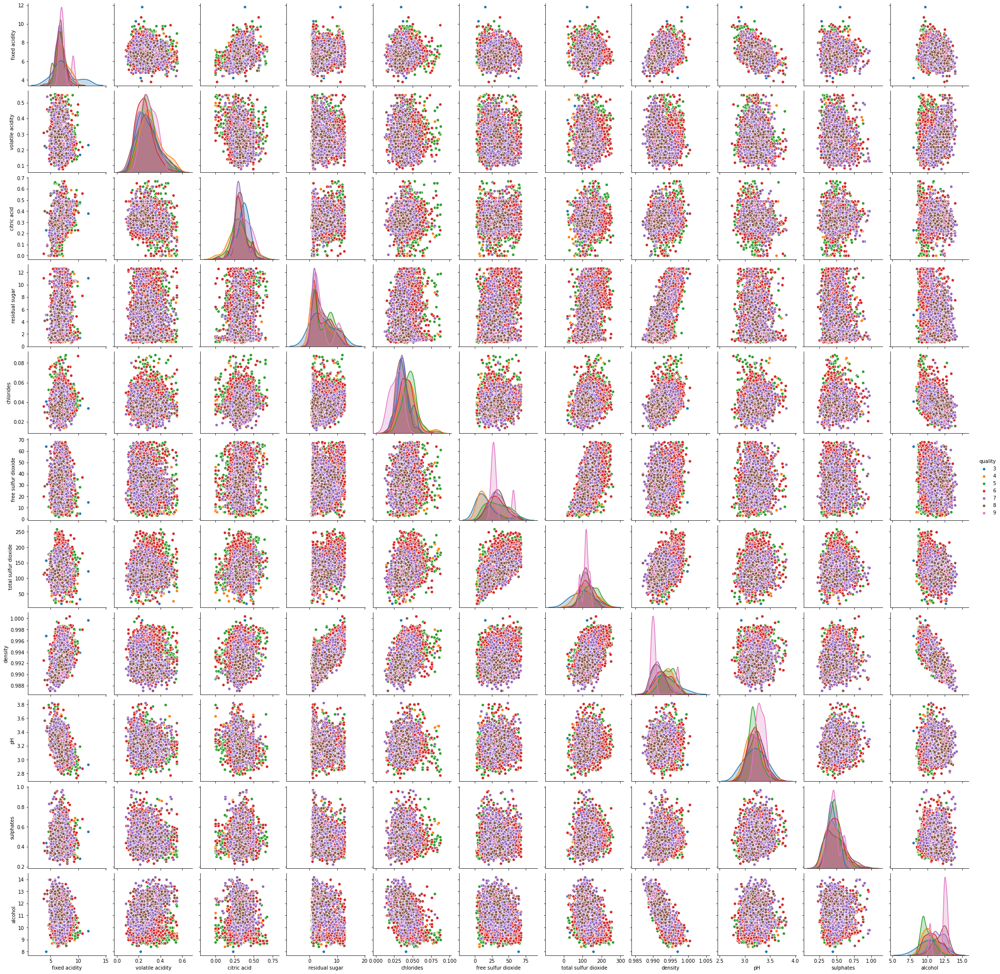

In [16]:
sea.pairplot(winne, hue='quality')

<b><h3>Разбинение датафрейма на фичи и таргеты</b></h3>

In [17]:
X_base = winne.loc[:,'fixed acidity':'alcohol']
y_base= winne.quality

<b><h3>Разбиение на тестовые трейновые наборы фич и таргетов</b></h3>

In [18]:
train_feach, test_feach, train_tag, test_tag = train_test_split(X_base, y_base, test_size = 0.2, random_state = 42)

<b><h3>Применяем Z-преобразование к наборам фич</b></h3>

In [19]:
train_feach = std.fit_transform(train_feach)
test_feach = std.fit_transform(test_feach)

<b><h3>Тренируем модели RandomForestClassifier, KNeighborsClassifier, SVC, GaussianNB для сравнения результатов </b></h3>

In [20]:
teching_model ={'random forest':forest.fit(train_feach, train_tag),
'SVC':svc.fit(train_feach, train_tag),
'K neibors':knn.fit(train_feach, train_tag),
'bayes': gaus.fit(train_feach, train_tag)}

<b><h3> Для оценки качества обучения моделей будет использованна метрика accuracy </b></h3>

In [21]:
for key in teching_model:
    print(f"{key} accuracy { metrics.accuracy_score(test_tag, teching_model[key].predict(test_feach))}")

random forest accuracy 0.6815203145478375
SVC accuracy 0.3944954128440367
K neibors accuracy 0.5150720838794234
bayes accuracy 0.4849279161205767


# Промежуточный вывод:
Данные датафрейма белого вина имеют недостаточное количесвто наблюдений по каждому классу качества вина, из за этого  при мультиклассовой класификации маленький процент правильных предскозаний.
Эту проблему предлагаю решить переходом от мультиклассовой класификации к бинарной, разделив данные вина на два класса: 

0 - "низкого качества" 3-6

1 - "высокого качества" 7-9


<b><h3> Разбиение данных на 2 класса </b></h3> 

In [22]:
winne['quality'][(winne.quality==3)|(winne.quality==5)|(winne.quality==4)|(winne.quality==6)]=0 #quality = [3-6]
winne['quality'][(winne.quality==7)|(winne.quality==8)|(winne.quality==9)]=1 #quality = [7, 9]

In [23]:
name =[i for i in winne.quality.value_counts().index.values] 
values = [winne.quality.value_counts()[i] for i in winne.quality.value_counts().index.values]
gist = [graph.Bar(x=name, y=values)]
graph.Figure(data=gist).update_layout(title = 'количесвто наблюдений в каждом классе качества')

<b><h3>график распределения наблюдаемых признаков </b></h3>

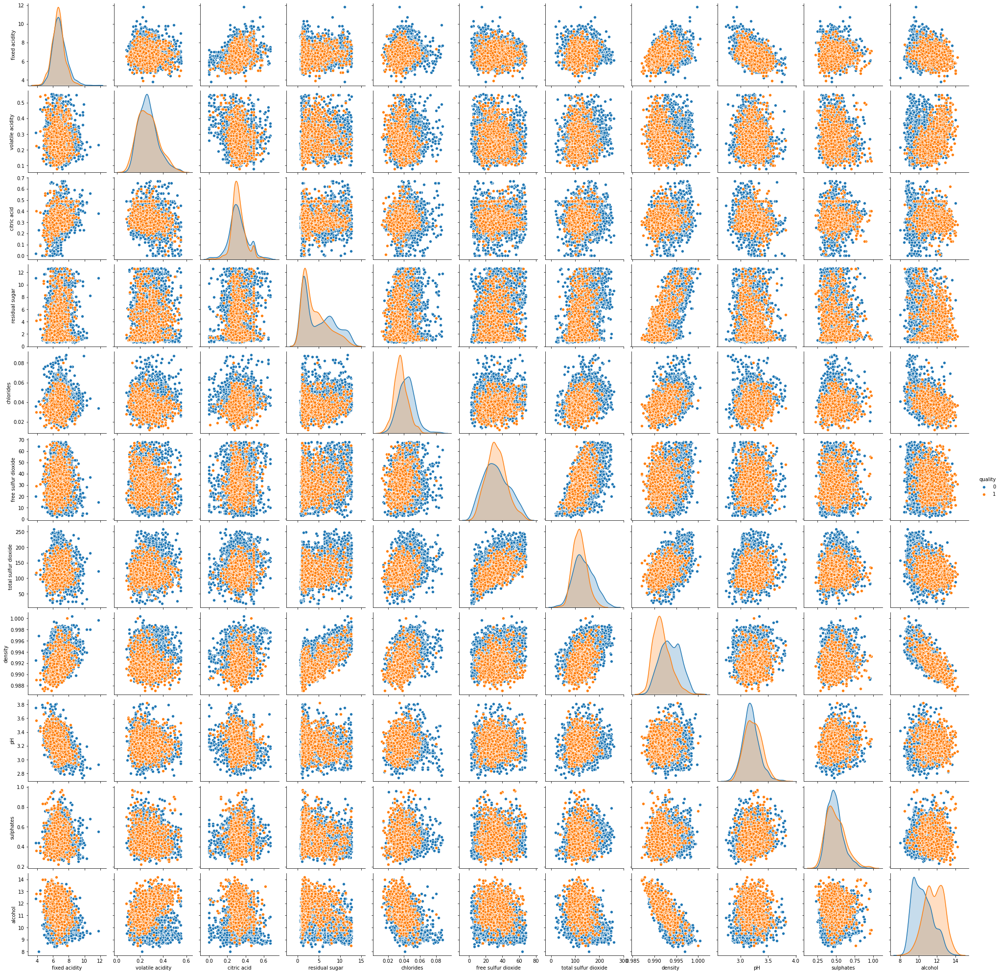

In [24]:
sea.pairplot(winne, hue='quality')

<b><h3>Повторение операций проводимых до классового преобразования</b></h3>

In [25]:
X = winne.loc[:,'fixed acidity':'alcohol']
y= winne.quality

In [26]:
train_feach, test_feach, train_tag, test_tag = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [27]:
std = StandardScaler()

In [28]:
train_feach = std.fit_transform(train_feach)
test_feach = std.fit_transform(test_feach)

In [29]:
forest = RandomForestClassifier(random_state=30, n_jobs=-1, n_estimators=200)
svc = SVC(kernel="sigmoid")
knn = KNeighborsClassifier(n_neighbors=3, n_jobs=-1)

In [30]:
teching_model ={'random forest':forest.fit(train_feach, train_tag),
'SVC':svc.fit(train_feach, train_tag),
'K neibors':knn.fit(train_feach, train_tag),
'bayes': gaus.fit(train_feach, train_tag)}

In [31]:
for key in teching_model:
    print(f"{key} accuracy { metrics.accuracy_score(test_tag, teching_model[key].predict(test_feach))}")

random forest accuracy 0.8715596330275229
SVC accuracy 0.7431192660550459
K neibors accuracy 0.8073394495412844
bayes accuracy 0.7706422018348624


# Промежуточный вывод:
При переходе к бинарной класификации количесвто правильных ответов  в RandomForest выросло на 0.19 %, в SVC на 0.35 %, в K neibors на 0.29 %, в bayes на 0.29 %. Можно сделать вывод что проведённые преоброзования были целесообразны.
По результатм сравнения количества правильных ответов наилучший результат даёт алгоритм RandomForestClassifier 0.87 %

In [32]:
rfc_eval = cross_val_score(estimator = forest, X = train_feach, y = train_tag, cv = 30)
rfc_eval.max()

0.9411764705882353

Наилучший результат который возможно получит при использовании  

<b><h3>Реализация класса для предскозания качества вина</b></h3>

In [33]:
class Wine_classifier:
    def __init__(self):
        self.forest = RandomForestClassifier(random_state=30, n_jobs=-1, class_weight='balanced', n_estimators=200)
        self.std = StandardScaler()
        self.win_df = pd.read_csv('winequality-white.csv',
                                  sep=';')
        self.drop_ejection()
        self.new_cat()
        self.train = self.win_df.sample(frac=0.7, random_state=200)
        self.test = self.win_df.drop(index=self.train.index)

    def drop_ejection(self):
        """
        Метод для удлаения выбросов 
        """
        for i in self.win_df.columns.values:
            self.win_df = self.win_df.drop(
                index=self.win_df[self.win_df[i].values / self.win_df[i].mean() > 2].index.values)

    def new_cat(self):
        """
        Формирование новых категорий
        """
        self.win_df['quality'][
            (self.win_df.quality == 3) | (self.win_df.quality == 5) | (self.win_df.quality == 4) | (
                    self.win_df.quality == 6)] = 0  # quality = [3-5]
        self.win_df['quality'][(self.win_df.quality == 7) | (self.win_df.quality == 8) | (
                self.win_df.quality == 9)] = 1  # quality = [7-9]

    def made_feature(self):
        """
        Создание признаков
        """
        return {"train_feat": self.std.fit_transform(self.train.drop(columns=['quality'])),
                "test_feat": self.std.fit_transform(self.test.drop(columns=['quality']))}

    def made_target(self):
        """
        Генерация таргетов
        """
        return {"train_tag": self.train['quality'],
                "test_tag": self.test['quality']}

    def train_model(self):
        """
        Тринорвка модели 
        """
        return self.forest.fit(self.made_feature()['train_feat'],
                               self.made_target()['train_tag'])

    def testing_model(self):
        """
        Получение результатов отценки качества 
        с использованием метрики accuracy
        """
        print(print(metrics.accuracy_score(self.made_target()["test_tag"], self.train_model().predict
        (self.made_feature()['test_feat']))))

    def predict_quality(self, feach):
        """
        Предасказание качества вина на основе переданных признаков 
        """
        print(f"wine quality with feature {feach[0]} is {self.train_model().predict(feach)[0]}")

    def predict_other_feature(self, quality, columns, val):
        """
        Этот метод предсаказывает осатльные признаки
        исходя из переданнойго значения определённого
        признакак(например рН) и класса качества.
        Праметр columns принимает на вход имя столбца из
        датафрейма self.wine_df, параметр val
        принимает численное значение columns
        """
        #Для предскозания количественны величин будет использованна линейная регрессия
        lin = LinearRegression()
        sample = self.win_df[self.win_df.quality == quality]
        X = sample[columns]
        sample = sample.drop(columns=[columns, 'quality'])
        res = {i: lin.fit(X.values.reshape(-1, 1), sample[i]).predict(val)[0] for i in sample.columns}
        res[columns] = val[0][0]
        res['quality'] = quality
        return pd.DataFrame(res, index=[0])

<b><h3>Демонстрация работы класса</b></h3>

In [34]:
win_class = Wine_classifier()

In [35]:
win_class.predict_quality([[6.30e+00, 3.00e-01, 3.40e-01, 1.60e+00, 4.90e-02, 1.40e+01,
                   1.32e+02, 9.94e-01, 3.30e+00, 4.90e-01, 9.50e+00]])

wine quality with feature [6.3, 0.3, 0.34, 1.6, 0.049, 14.0, 132.0, 0.994, 3.3, 0.49, 9.5] is 0


In [36]:
win_class.predict_other_feature(0, "pH", [[3.3]])

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,sulphates,alcohol,pH,quality
0,6.607277,0.265313,0.313104,4.79703,0.043871,32.96268,138.731898,0.993758,0.497303,10.471137,3.3,0


# Вывод 
С использование класса Wine_classifier, в котором реалтзованны методы для предсказания качества вина и предскозания определённых качеств вина, возможно минимизировать расходы на производство вина за счёт уменьшения расходов на лабараторные иследования проб вина входе производства и уменьшить расходы на персоонал, тем самым повысить рентабельность.
Для использования класса Wine_classifier в промышленном производстве вина необходимы существенные доработки, такие как:

1. Реализация мультиклассовой классификации с точнойсть более 0.9 % 

2. Создание пользовательского интерфейса 

3. Одоптация програмного обеспечения под производство 